#### Step -1: Plotting Corners on Chess Board

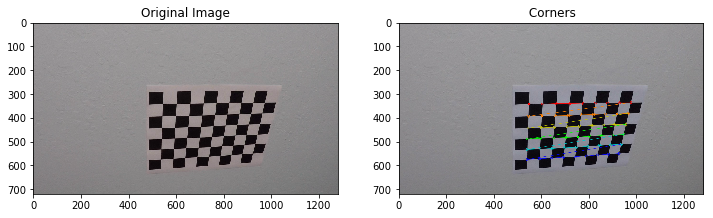

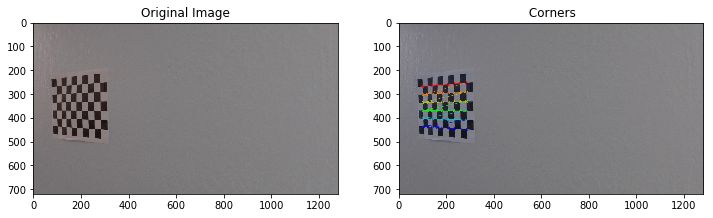

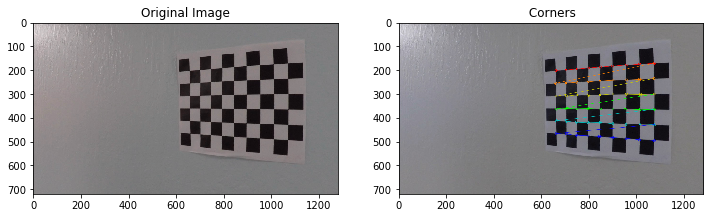

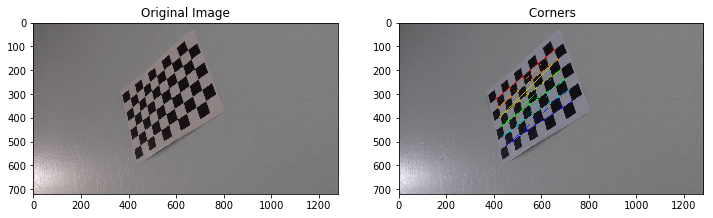

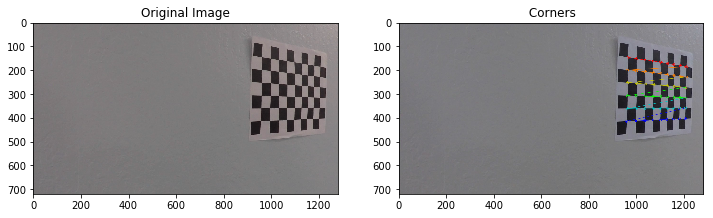

...

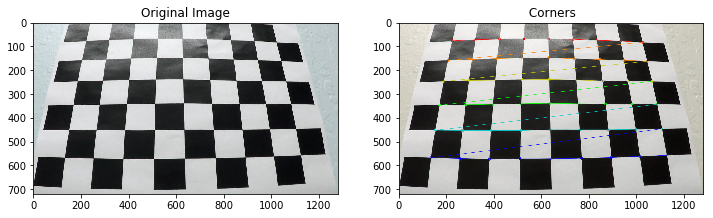

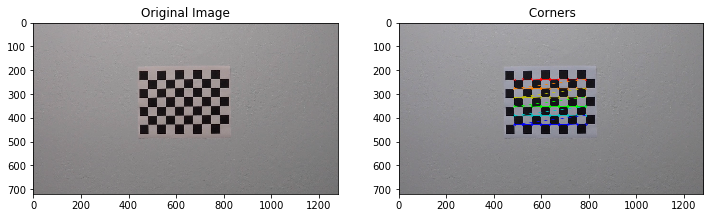

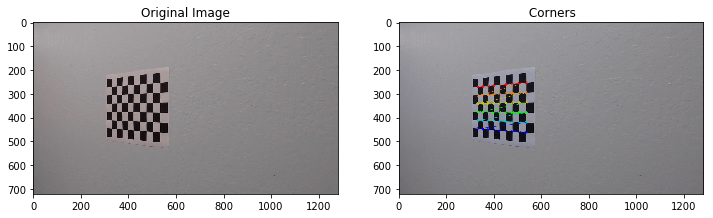

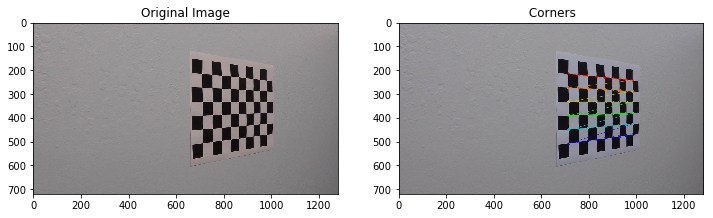

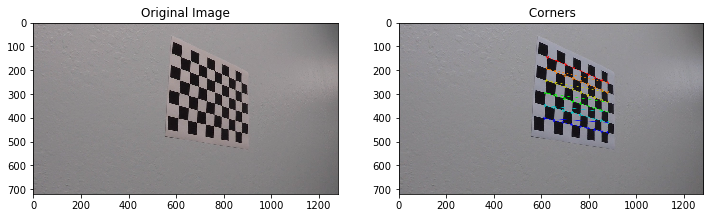

In [1]:
import glob
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np


#Defining Object points
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)
objpoints = []
imgpoints = []


images = glob.glob('camera_cal/calibration*.jpg')

for i, image in enumerate(images):
    img = cv2.imread(image)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
        ax1.imshow(cv2.cvtColor(mpimg.imread(image), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=12)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title(' Corners', fontsize=12)
        plt.show()

#### Step-2: Correcting Distortion



In [2]:
def C_distortion(image):
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

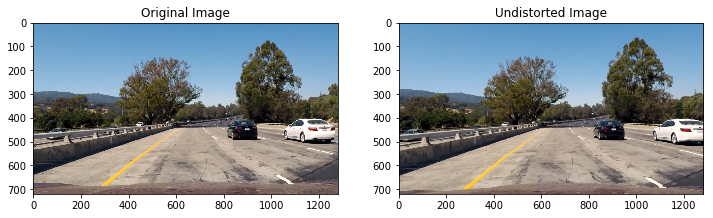

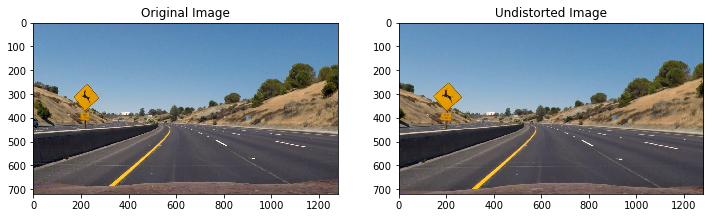

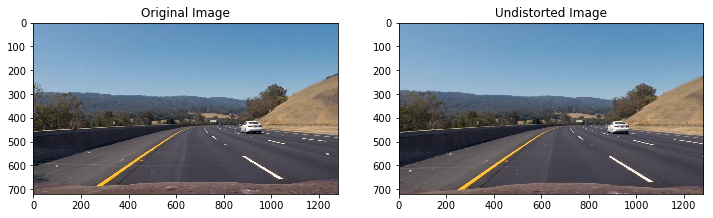

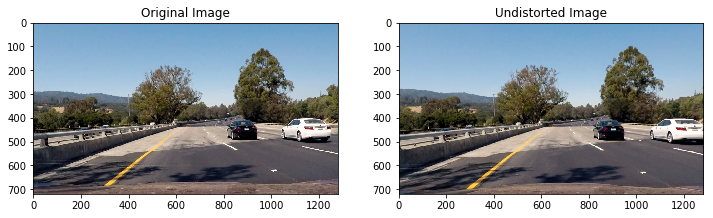

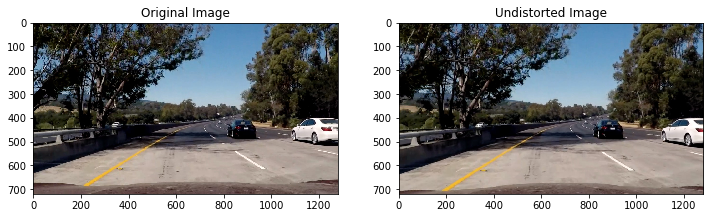

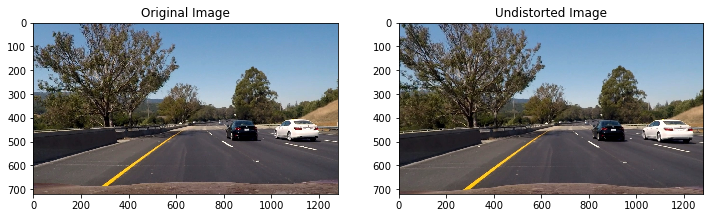

In [3]:
for image in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image)
    undist=C_distortion(image)  
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=12)
    ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=12)
    plt.show()

#### Applying Persprective Transformation

In [4]:
def M_transform(image):
    src=np.float32([[500,490],[830,490],[1250,720],[50,720]])
    dst=np.float32([[0,0],[1280,0],[1250,720],[50,720]])
    M = cv2.getPerspectiveTransform(src, dst)
    return M

In [5]:
def W_transform(undist,M,img_size):
    warped = cv2.warpPerspective(undist, M, img_size)
    return warped

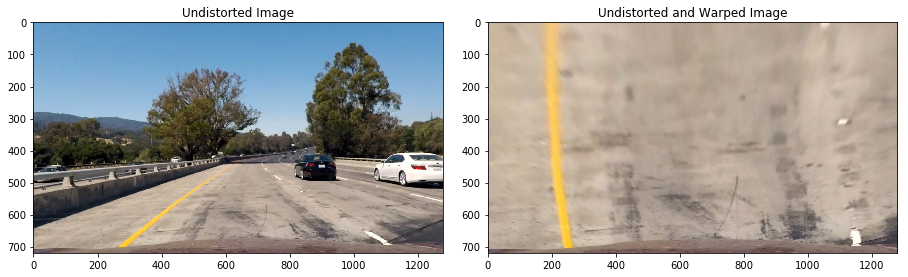

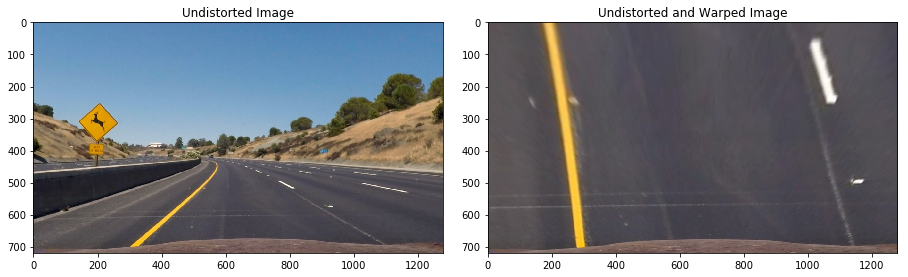

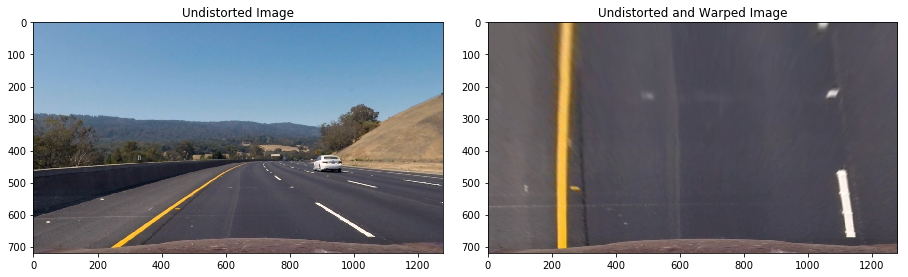

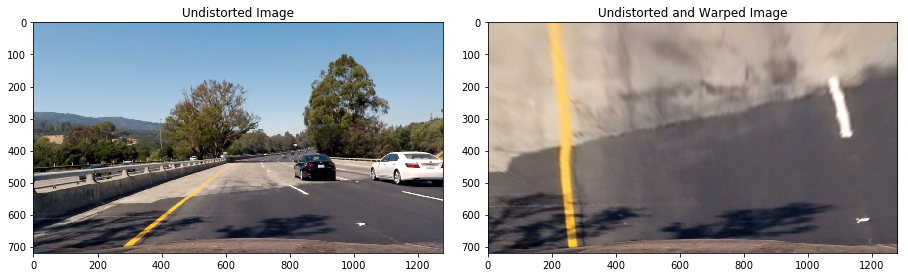

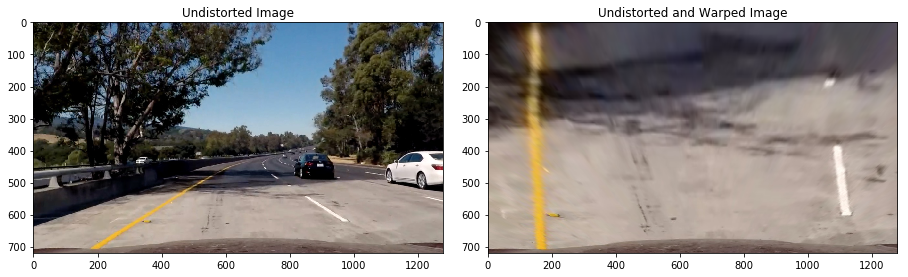

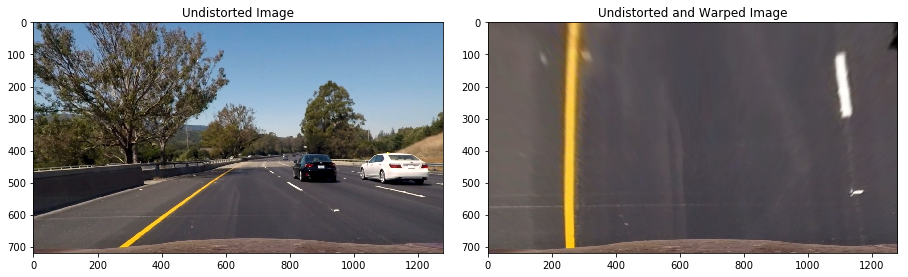

In [6]:
for image in glob.glob('test_images/test*.jpg'):
    img_size = (img.shape[1], img.shape[0])
    img=cv2.imread(image)
    undist=C_distortion(image)
    M=M_transform(image)
    warped=W_transform(undist,M,img_size)
    
    # Displaying the Images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax1.set_title('Undistorted Image', fontsize=12)
    ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted and Warped Image', fontsize=12)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

#### Applying Binary & Gradient Threshold

In [7]:
def BG_transform(warped):
    #converting image into hls channel
    hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS)
    s_channel=hls[:,:,2]  
    gray = cv2.cvtColor(warped, cv2.COLOR_RGB2GRAY)
    
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx) 
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    thresh_min = 10
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

      

    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    #returning a stack of the two binary images
    
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # Combining the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
     
 
    return combined_binary,s_binary,sxbinary
        

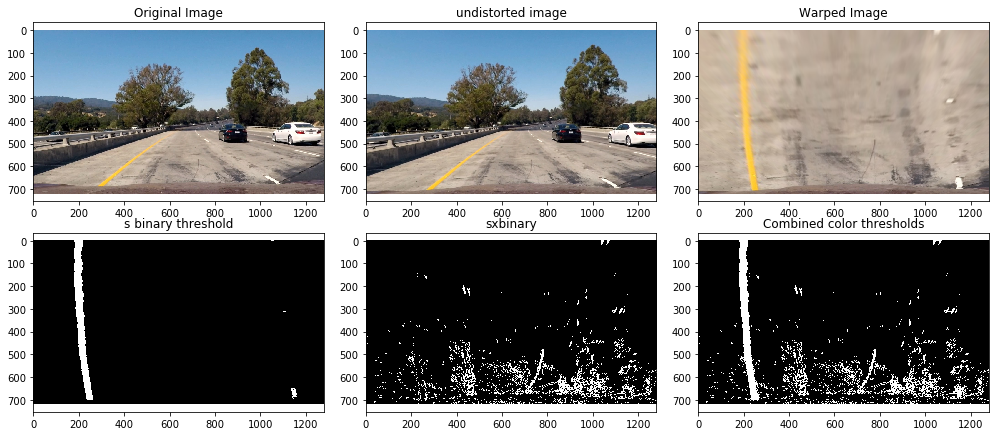

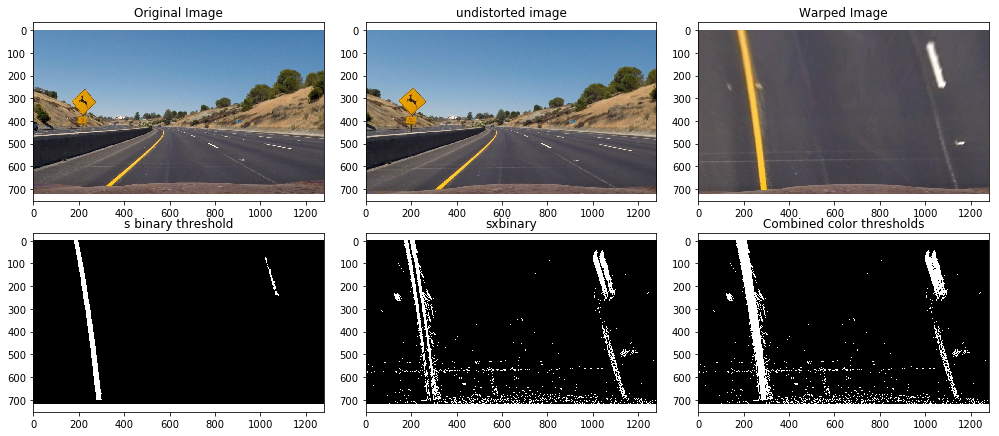

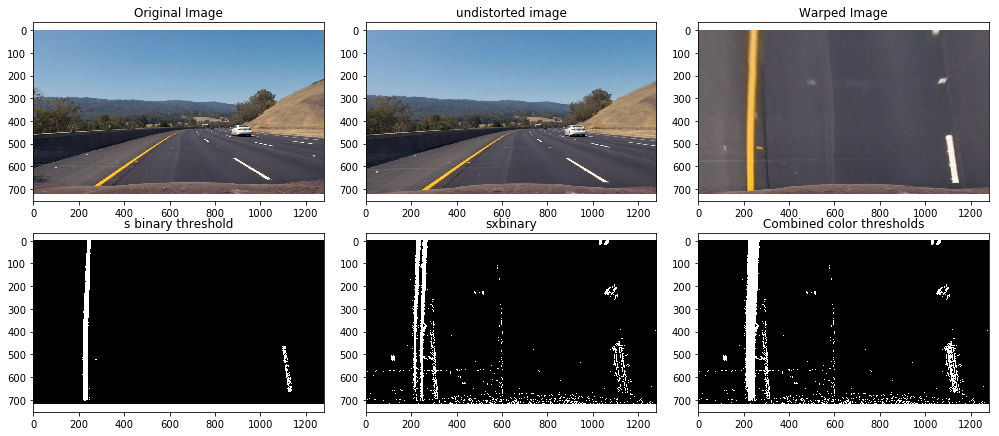

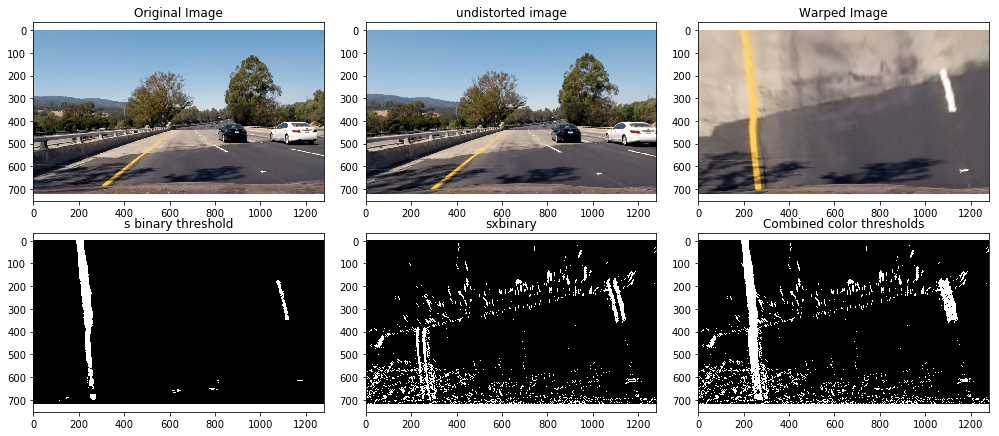

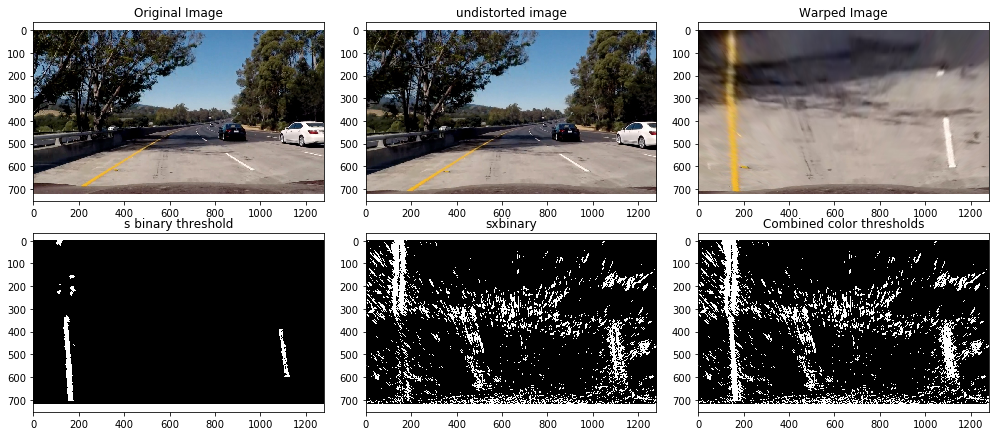

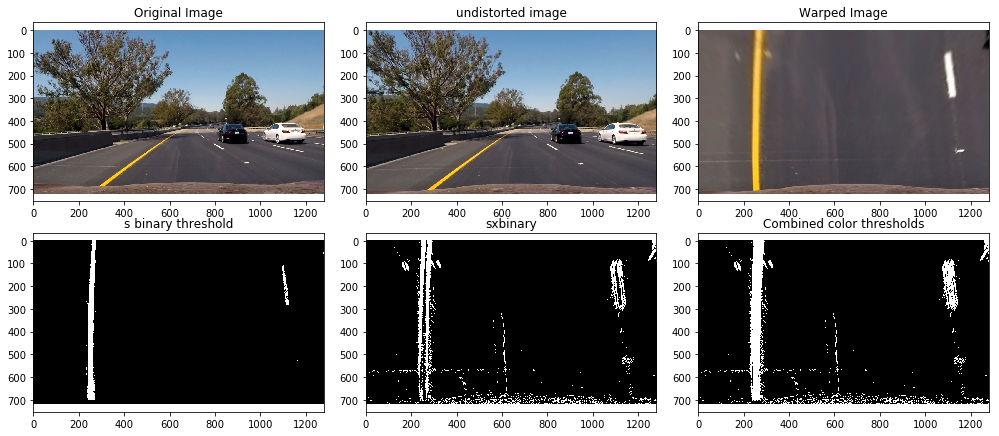

In [8]:
for image in glob.glob('test_images/test*.jpg'):
    img_size = (img.shape[1], img.shape[0])
    img=cv2.imread(image)
    undist=C_distortion(image)
    M=M_transform(image)
    warped=W_transform(undist,M,img_size)
    combined_binary,s_binary,sxbinary=BG_transform(warped)
    
    f, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(2,3, sharey='col', sharex='row', figsize=(14,6))
    f.tight_layout()
        
    ax1.set_title('Original Image', fontsize=12)
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    ax2.set_title('undistorted image', fontsize=12)
    ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        
    ax3.set_title('Warped Image', fontsize=12)
    ax3.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        
    ax4.set_title('s binary threshold', fontsize=12)
    ax4.imshow(s_binary, cmap='gray')
        
    ax5.set_title('sxbinary', fontsize=12)
    ax5.imshow(sxbinary, cmap='gray')
        
    ax6.set_title('Combined color thresholds', fontsize=12)
    ax6.imshow(combined_binary, cmap='gray')
    plt.show()
    

#### Fitting a Polynomial to lane lines

In [9]:
def P_lines(combined_binary,image,warped):
    
    right_x = []
    right_y = []
    left_x = []
    left_y = []
    
    x, y = np.nonzero(np.transpose(combined_binary))
    
    i = int(combined_binary.shape[1]/2)
    j = int(combined_binary.shape[0]/2)
    while j >= 0:
        histogram = np.sum(combined_binary[j:i,:], axis=0)
        left_peak = np.argmax(histogram[:700])
        x_idx = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            left_x.extend(x_window.tolist())
            left_y.extend(y_window.tolist())

        right_peak = np.argmax(histogram[700:]) + 700
        x_idx = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            right_x.extend(x_window.tolist())
            right_y.extend(y_window.tolist())
        i -= 30
        j -= 30
    # converting x,y values to float 32 types in a array format to both side left and right
    left_y = np.array(left_y).astype(np.float32)
    left_x = np.array(left_x).astype(np.float32)
    right_y = np.array(right_y).astype(np.float32)
    right_x = np.array(right_x).astype(np.float32)
    #Applying Polyfit function and finding points required to draw lines
    #For Left Side
    left_fit = np.polyfit(left_y, left_x, 2)
    left_fitx = left_fit[0]*left_y**2 + left_fit[1]*left_y + left_fit[2]
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    left_x = np.append(left_x, leftx_int)
    left_y = np.append(left_y, 720)
    left_x = np.append(left_x,left_fit[0]*0**2 + left_fit[1]*0 + left_fit[2])
    left_y = np.append(left_y, 0)
    #For Right Side
    right_fit = np.polyfit(right_y, right_x, 2)
    right_fitx = right_fit[0]*right_y**2 + right_fit[1]*right_y + right_fit[2]
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    right_x = np.append(right_x,rightx_int)
    right_y = np.append(right_y, 720)
    right_x = np.append(right_x,right_fit[0]*0**2 + right_fit[1]*0 + right_fit[2])
    right_y = np.append(right_y, 0)
    
    #Applying Sorting on the basis of y data points and arranging values 
    lsort = np.argsort(left_y)
    rsort = np.argsort(right_y)
    left_y = left_y[lsort]
    left_x = left_x[lsort]
    right_y = right_y[rsort]
    right_x = right_x[rsort]
    #Drawing line on both left and right side of the line
    left_fit = np.polyfit(left_y, left_x, 2)
    left_fitx = left_fit[0]*left_y**2 + left_fit[1]*left_y + left_fit[2]
    right_fit = np.polyfit(right_y, right_x, 2)
    right_fitx = right_fit[0]*right_y**2 + right_fit[1]*right_y + right_fit[2]
    
    # Measuring Radius of Curvature for each lane line
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    left_fit_cr = np.polyfit(left_y*ym_per_pix, left_x*xm_per_pix, 2)
    right_fit_cr = np.polyfit(right_y*ym_per_pix, right_x*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(left_y) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(left_y) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    
    # Calculating the position of the vehicle
    center = abs(640 - ((rightx_int+leftx_int)/2))
    
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[480, 520],[820, 520],
                      [1280, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1280, 720],[40, 720]])
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, left_y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, right_y]))])
    
    pts = np.hstack((pts_left, pts_right))
    #Drawing Lines and filling the color 
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (255,0,0))
    
    newwarp = cv2.warpPerspective(color_warp, Minv, (combined_binary.shape[1], combined_binary.shape[0]))
    result = cv2.addWeighted(mpimg.imread(image), 1, newwarp, 0.5, 0)
    
    return result,left_fitx,left_y,right_fitx,right_y,center,left_curverad,right_curverad


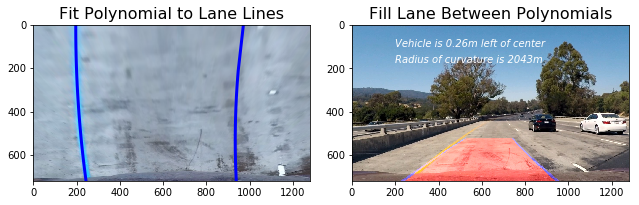

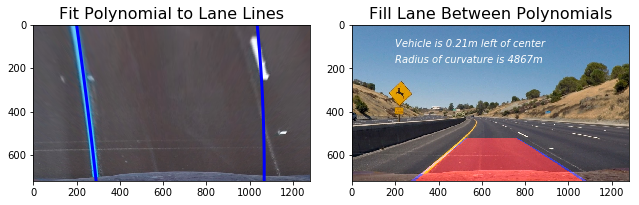

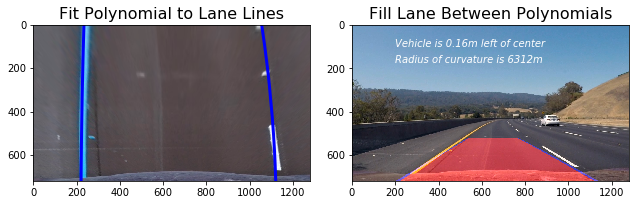

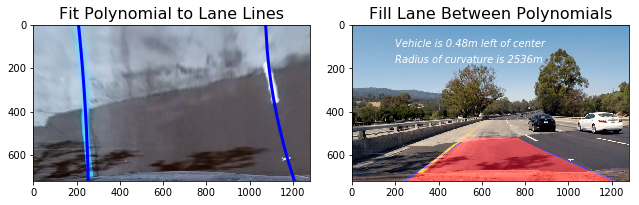

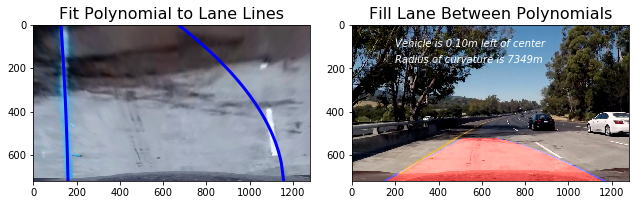

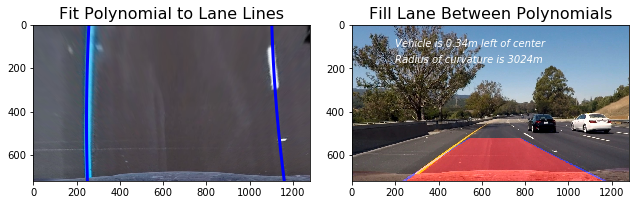

In [10]:
for image in glob.glob('test_images/test*.jpg'):
    img_size = (img.shape[1], img.shape[0])
    img=cv2.imread(image)
    undist=C_distortion(img)
    M=M_transform(img)
    warped=W_transform(undist,M,img_size)
    combined_binary,s_binary,sxbinary=BG_transform(warped)
    result,left_fitx,left_y,right_fitx,right_y,center,left_curverad,right_curverad=P_lines(combined_binary,image,warped)
    
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(warped)
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(0, 720)
    ax1.plot(left_fitx, left_y, color='blue', linewidth=3)
    ax1.plot(right_fitx, right_y, color='blue', linewidth=3)
    ax1.set_title('Fit Polynomial to Lane Lines', fontsize=16)
    ax1.invert_yaxis() # to visualize as we do the images
    ax2.imshow(result)
    ax2.set_title('Fill Lane Between Polynomials', fontsize=16)
    if center < 640:
        ax2.text(200, 100, 'Vehicle is {:.2f}m left of center'.format(center*3.7/700),
                 style='italic', color='white', fontsize=10)
    else:
        ax2.text(200, 100, 'Vehicle is {:.2f}m right of center'.format(center*3.7/700),
                 style='italic', color='white', fontsize=10)
    ax2.text(200, 175, 'Radius of curvature is {}m'.format(int((left_curverad + right_curverad)/2)),
             style='italic', color='white', fontsize=10)
    plt.show()
    
    
    
    

In [11]:
from collections import deque

class Line:
    def __init__(self):
        # Was the line found in the previous frame?
        self.found = False
        
        # Remembering x and y values of lanes in previous frame
        self.X = None
        self.Y = None
        
        # Store recent x intercepts for averaging across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
        
        # Remember previous x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        
        # Remember radius of curvature
        self.radius = None
        
        # Store recent polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=10)
        self.fit1 = deque(maxlen=10)
        self.fit2 = deque(maxlen=10)
        self.fitx = None
        self.pts = []
        
        # Count the number of frames
        self.count = 0
        
        
            
    def found_search(self, x, y):
        '''
        This function is applied when the lane lines have been detected in the previous frame.
     
        '''
        xvals = []
        yvals = []
        if self.found == True:
            
            i = 720
            j = 640
            while j >= 0:
                yval = np.mean([i,j])
                xval = (np.mean(self.fit0))*yval**2 + (np.mean(self.fit1))*yval + (np.mean(self.fit2))
                x_idx = np.where((((xval - 25) < x)&(x < (xval + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    np.append(xvals, x_window)
                    np.append(yvals, y_window)
                i -= 30
                j -= 30
        if np.sum(xvals) == 0: 
            self.found = False # If no lane pixels were detected then perform blind search
        return xvals, yvals, self.found
    
    def blind_search(self, x, y, image):
        '''
        This function is applied in the first few frames and/or if the lane was not successfully detected
        in the previous frame. It uses a slinding window approach to detect peaks in a histogram of the
        binary thresholded image. Pixels in close proimity to the detected peaks are considered to belong
        to the lane lines.
        '''
        xvals = []
        yvals = []
        if self.found == False: 
            i = int(image.shape[1]/2)
            j = int(image.shape[0]/2)
            while j >= 0:
                histogram = np.sum(combined_binary[j:i,:], axis=0)
                
                if self ==Right:
                    peak = np.argmax(histogram[700:]) + 700
                else:
                    peak = np.argmax(histogram[:700])
                x_idx = np.where((((peak - 25) < x)&(x < (peak + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    xvals.extend(x_window)
                    yvals.extend(y_window)
                i -= 30
                j -= 30
        if np.sum(xvals) > 0:
            self.found = True
        else:
            yvals = self.Y
            xvals = self.X
        return xvals, yvals, self.found
    
    def radius_of_curvature(self, xvals, yvals):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(yvals) + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return curverad
    
    def sort_vals(self, xvals, yvals):
        sorted_index = np.argsort(yvals)
        sorted_yvals = yvals[sorted_index]
        sorted_xvals = xvals[sorted_index]
        return sorted_xvals, sorted_yvals
    
    def get_intercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        return bottom, top
    
    

In [12]:
def correct_img(img):
      
                    
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)  # convert from BGR to LAB color space
    l, a, b = cv2.split(lab)  # split on 3 different channels

    l2 = clahe.apply(l)  # apply CLAHE to the L-channel

    lab = cv2.merge((l2,a,b))  # merge channels
    img = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    

    return img


In [13]:
def process(image):
    img_size = (image.shape[1], image.shape[0])
    
    # Calibrate camera and undistort image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    #Correcting for brightness and contrast
    undist=correct_img(undist)
    # Perform perspective transform
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[0, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)
    
    combined_binary,s_binary,sxbinary=BG_transform(warped)
    
    # Identify all non zero pixels in the image
    x, y = np.nonzero(np.transpose(combined_binary)) 

    if Left.found == True: # Search for left lane pixels around previous polynomial
        leftx, lefty, Left.found = Left.found_search(x, y)
        
    if Right.found == True: # Search for right lane pixels around previous polynomial
        rightx, righty, Right.found = Right.found_search(x, y)

            
    if Right.found == False: # Perform blind search for right lane lines
        rightx, righty, Right.found = Right.blind_search(x, y, combined_binary)
            
    if Left.found == False:# Perform blind search for left lane lines
        leftx, lefty, Left.found = Left.blind_search(x, y, combined_binary)

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
            
    # Calculate left polynomial fit based on detected pixels
    left_fit = np.polyfit(lefty, leftx, 2)
    
    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    leftx_int, left_top = Left.get_intercepts(left_fit)
    
    # Average intercepts across n frames
    Left.x_int.append(leftx_int)
    Left.top.append(left_top)
    leftx_int = np.mean(Left.x_int)
    left_top = np.mean(Left.top)
    Left.lastx_int = leftx_int
    Left.last_top = left_top
    
    # Add averaged intercepts to current x and y vals
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx, left_top)
    lefty = np.append(lefty, 0)
    
    # Sort detected pixels based on the yvals
    leftx, lefty = Left.sort_vals(leftx, lefty)
    
    Left.X = leftx
    Left.Y = lefty
    
    # Recalculate polynomial with intercepts and average across n frames
    left_fit = np.polyfit(lefty, leftx, 2)
    Left.fit0.append(left_fit[0])
    Left.fit1.append(left_fit[1])
    Left.fit2.append(left_fit[2])
    left_fit = [np.mean(Left.fit0), 
                np.mean(Left.fit1), 
                np.mean(Left.fit2)]
    
    # Fit polynomial to detected pixels
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    Left.fitx = left_fitx
    
    # Calculate right polynomial fit based on detected pixels
    right_fit = np.polyfit(righty, rightx, 2)

    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    rightx_int, right_top = Right.get_intercepts(right_fit)
    
    # Average intercepts across 5 frames
    Right.x_int.append(rightx_int)
    rightx_int = np.mean(Right.x_int)
    Right.top.append(right_top)
    right_top = np.mean(Right.top)
    Right.lastx_int = rightx_int
    Right.last_top = right_top
    rightx = np.append(rightx, rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx, right_top)
    righty = np.append(righty, 0)
    
    # Sort right lane pixels
    rightx, righty = Right.sort_vals(rightx, righty)
    Right.X = rightx
    Right.Y = righty
    
    # Recalculate polynomial with intercepts and average across n frames
    right_fit = np.polyfit(righty, rightx, 2)
    Right.fit0.append(right_fit[0])
    Right.fit1.append(right_fit[1])
    Right.fit2.append(right_fit[2])
    right_fit = [np.mean(Right.fit0), np.mean(Right.fit1), np.mean(Right.fit2)]
    
    # Fit polynomial to detected pixels
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    Right.fitx = right_fitx
        
    # Compute radius of curvature for each lane in meters
    left_curverad = Left.radius_of_curvature(leftx, lefty)
    right_curverad = Right.radius_of_curvature(rightx, righty)
        
    # Only print the radius of curvature every 3 frames for improved readability
    if Left.count % 3 == 0:
        Left.radius = left_curverad
        Right.radius = right_curverad
        
    # Calculate the vehicle position relative to the center of the lane
    position = (rightx_int+leftx_int)/2
    distance_from_center = abs((700 - position)*3.7/700) 
                
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.fitx, Left.Y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right.Y]))])
    pts = np.float16(np.hstack((pts_left, pts_right)))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(255,0,0), thickness = 20)
    cv2.fillPoly(color_warp, np.int_(pts), (255,34,34))
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))
    result = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)
        
    # Print distance from center on video
    if position > 700:
        cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(distance_from_center), (100,80),
                 cv2.FONT_HERSHEY_SIMPLEX,2, color=(255,255,255), thickness = 1)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(distance_from_center), (100,80),
                 cv2.FONT_HERSHEY_SIMPLEX,2, color=(255,255,255), thickness = 1)
    # Print radius of curvature on video
    cv2.putText(result, 'Radius of Curvature {}(m)'.format(int((Left.radius+Right.radius)/2)), (120,140),
             cv2.FONT_HERSHEY_SIMPLEX,2, color=(255,255,255), thickness = 1)
    Left.count += 1
    return result

In [16]:
from moviepy.editor import VideoFileClip
Left = Line()
Right = Line()
video_output = 'project_results.mp4'
video = VideoFileClip("project_video.mp4")
video = video.fl_image(process) 
video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_results.mp4
[MoviePy] Writing video project_results.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [47:42<00:01,  1.88s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_results.mp4 



In [15]:
from moviepy.editor import VideoFileClip
Left = Line()
Right = Line()
video_output = 'challenge_result.mp4'
video = VideoFileClip("challenge_video.mp4")
video = video.fl_image(process) 
video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video challenge_result.mp4
[MoviePy] Writing video challenge_result.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [15:33<00:00,  1.75s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_result.mp4 

